In [3]:
import pandas as pd
import numpy as np
from model_function import Load_Model
import warnings
warnings.filterwarnings("ignore")

X_train_df = pd.DataFrame(Load_Model("X_train"), columns = Load_Model("features"))
X_test_df = pd.DataFrame(Load_Model("X_test"), columns = Load_Model("features"))
X_test = Load_Model("X_test")
y_test = Load_Model("y_test")
X_train = Load_Model("X_train")
y_train = Load_Model("y_train")
features = Load_Model("features")
model = Load_Model('xgb_model')

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.




In [4]:
from model_function import TwoStageXGB

xgb2sg = TwoStageXGB()
xgb2sg.fit(X_train, y_train)
y_predxgb2 = xgb2sg.predict(X_test)
y_predxgb2

array([0.        , 0.7722644 , 0.12173709, ..., 0.8388178 , 2.3109682 ,
       0.02267693], dtype=float32)

In [5]:
from pert_metrics import perturb


# Functions

In [1]:
# LIME  

from lime.lime_tabular import LimeTabularExplainer

# Global lime values

def LIME_global(X_train, X_test, features, model):
    explainer = LimeTabularExplainer(training_data=X_train, feature_names=features, class_names=y_train, verbose=True, mode='regression', discretize_continuous=False, random_state=0)
    lime_dict = {}
    for f in features:
        lime_dict[f] = []
    for i in range(len(X_test)):
        instance = X_test[i]
        explanation = explainer.explain_instance(instance, model.predict, num_features=len(features))
        explist = dict(explanation.as_list())
        for feature in explist.keys():
            # if feature not in lime_dict:
            #     lime_dict[feature] = []
            lime_dict[feature].append(explist[feature])
    lime_df = pd.DataFrame(lime_dict)
    return lime_df


In [2]:
def similar_perturbations(X, features, model, perturbation, sim_th, seed=None):

    X_df = pd.DataFrame(X, columns = features)
    X = np.array(X)
    #X_test_df = pd.DataFrame(X, columns = features)

    X_p = np.array(perturb(X_df,features, 0, perturbation , seed=seed))
    #X_test_p = np.array(perturb(X_test_df,features, 0, perturbation, seed=0))

    y_pred_p = model.predict(X)
    y_pred = model.predict(X_p)

    d = np.abs(y_pred_p - y_pred)
    # pd.DataFrame([y_pred, y_pred_p, y_pred_p - y_pred])

    idx_similar = np.where(d < sim_th*y_pred)[0]
    #print(idx_similar[:10])
    #idx_similar.shape

    X_p_similar = X_p[idx_similar]
    X_similar = X[idx_similar]

    return X_similar, X_p_similar

In [6]:
# RIS formula interpretation: elementwise division
max_ratio = 0
p = 2  
ratiolist = []

def RIS_elementwise(X_sim, X_prime, exp, exp_prime, p, epsilon_min):
    # replace 0's with 0.0001 to avoid division by zero
    exp = np.where(exp == 0, 0.0001, np.array(exp))
    exp_prime = np.where(exp_prime == 0, 0.0001, np.array(exp_prime))
    X_sim = np.where(X_sim == 0, 0.0001, np.array(X_sim))
    X_prime = np.where(X_prime == 0, 0.0001, np.array(X_prime))

    
    ratiolist = []
    max_ratio = 0
    if len(X_sim) != len(X_prime) or len(exp) != len(exp_prime) or len(X_sim) != len(exp):
        raise ValueError("The length of the input data and the explanation data should be the same.")
    
    for i in range(len(X_prime)):     

        diff_ex =(exp[i] - exp_prime[i])/exp[i]
        #print(exp[i], exp_prime[i], diff_ex)
        numerator = np.linalg.norm(diff_ex, p)

        diff_input = (X_sim[i] - X_prime[i])/X_sim[i]
        denominator = max(np.linalg.norm(diff_input, ord=p), epsilon_min)

        ratio = numerator / denominator
        ratiolist.append(ratio)

    return ratiolist, np.mean(ratiolist)

In [7]:
# RIS formula interpretation: division of norms

max_ratio = 0
p = 2  
ratiolist = []

def RIS_norm(X_sim, X_prime, exp, exp_prime, p, epsilon_min):
    X_sim = np.array(X_sim)
    X_prime = np.array(X_prime)
    exp = np.array(exp)
    exp_prime = np.array(exp_prime)
    
    ratiolist = []
    max_ratio = 0
    if len(X_sim) != len(X_prime) or len(exp) != len(exp_prime) or len(X_sim) != len(exp):
        raise ValueError("The length of the input data and the explanation data should be the same.")
    
    for i in range(len(X_prime)):
        
        diff_ex = np.linalg.norm(exp[i] - exp_prime[i], p)
        numerator = diff_ex / np.linalg.norm(exp[i], p) 

        diff_input = np.linalg.norm(X_sim[i] - X_prime[i]) #/X_sim[i]
        denominator = max(diff_input / np.linalg.norm(X_sim[i], ord=p), epsilon_min)

        ratio = numerator / denominator
        ratiolist.append(ratio)

    return ratiolist, np.mean(ratiolist)

2
[[ 1.94400056 -1.19625832 -0.23296724 ... -0.7626597  -0.26137915
  -0.23694921]
 [-0.47955671  0.18324065 -0.08489319 ... -0.72262876 -0.06297004
   0.64173441]
 [-0.11109064 -0.27088111 -0.27783906 ...  1.8102849  -0.26102247
  -0.21292938]
 ...
 [ 0.96162067 -1.39781959 -0.03626291 ... -0.62138317 -0.09638748
  -0.23389394]
 [ 2.13319753 -0.82180011  0.04421726 ... -0.79383036  0.0877895
  -0.05406131]
 [-0.12482284  1.37484323 -0.27670237 ...  1.71350186 -0.2704481
  -0.22932663]]
[[ 1.9520037  -1.1928494  -0.23835896 ... -0.73345794 -0.28211375
  -0.22805066]
 [-0.45998195  0.22297862 -0.09256166 ... -0.72234854 -0.03620108
   0.62950165]
 [-0.06627278 -0.26865508 -0.29280731 ...  1.80866343 -0.24633985
  -0.19152349]
 ...
 [ 2.4498697  -0.9426969  -0.02203075 ...  1.30050425 -0.0557981
  -0.18139161]
 [-1.05102883  1.16147246 -0.14320951 ... -0.75938984 -0.15603949
   1.00360991]
 [-0.13727886  1.36747542 -0.28621446 ...  1.73628114 -0.25684027
  -0.20518293]]
[[ 1.96000685 -1.

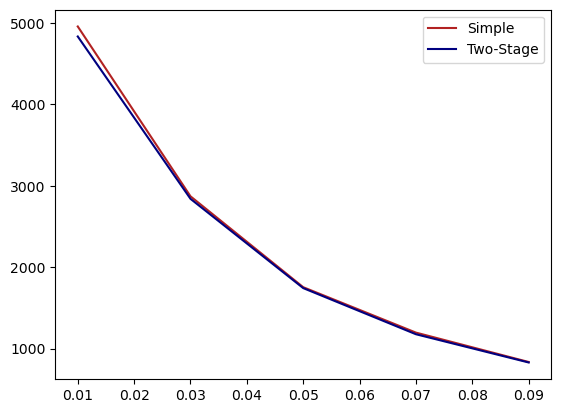

In [9]:
# stability analysis of results
# plot count of similar_perturbations per pertubation
simple = []
twost = []
pert = [0.01, 0.03, 0.05, 0.07, 0.09]
for n in range(len(pert)):
    print(p)
    o, p = similar_perturbations(X_test, features, model, perturbation=pert[n], sim_th=0.01, seed=0)
    simple.append(len(o))
    o2, p2 = similar_perturbations(X_test, features, xgb2sg, perturbation = pert[n], sim_th=0.01, seed=0)
    twost.append(len(o2))
    
#plot simple & twost vs pert
from matplotlib import pyplot as plt

plt.plot(pert, simple, label = "Simple", color = "firebrick")
plt.plot(pert, twost, label = "Two-Stage", color = "navy")
plt.legend()

# Single RIS Values

## LIME

In [40]:
X_sim1, X_sim_p1 = similar_perturbations(X_test, features, model, perturbation = 0.05, sim_th=0.01, seed=0)

In [41]:
lime_exp = LIME_global(X_train, X_sim1, features, model)
lime_exp_p = LIME_global(X_train, X_sim_p1, features, model)

Intercept 0.4415617818813169
Prediction_local [2.2160757]
Right: 0.7722644
Intercept 0.4615012648211645
Prediction_local [0.46350949]
Right: 0.12173709
Intercept 0.43874341717848386
Prediction_local [2.25337757]
Right: 1.7057182
Intercept 0.40563815126342295
Prediction_local [1.88693682]
Right: 2.8154812
Intercept 0.43059117692988713
Prediction_local [0.26277877]
Right: 0.01746045
Intercept 0.41014004998018283
Prediction_local [0.68391737]
Right: 0.11755557
Intercept 0.43722934409869824
Prediction_local [-0.10655642]
Right: 0.059326336
Intercept 0.4683579015506567
Prediction_local [1.22664053]
Right: 0.32243693
Intercept 0.438651383013239
Prediction_local [-0.06541184]
Right: 0.07523854
Intercept 0.4425082151763003
Prediction_local [0.18413445]
Right: 0.026629847
Intercept 0.4591556546434702
Prediction_local [0.78131467]
Right: 0.21821369
Intercept 0.43861172313926927
Prediction_local [-0.62179342]
Right: 0.007501701
Intercept 0.41476146414934045
Prediction_local [-0.21414227]
Right: 0

In [42]:
p = 2 # euclidian norm
epsilon_min = 0.1 # minimum value of the denominator

print(RIS_elementwise(X_sim1, X_sim_p1, lime_exp, lime_exp_p, p, epsilon_min)[1])
print(RIS_norm(X_sim1, X_sim_p1, lime_exp, lime_exp_p, p, epsilon_min)[1])

0.755102200959793
0.08264971696367268


### Two-Stage Model

In [35]:
X_sim2, X_sim_p2 = similar_perturbations(X_test, features, xgb2sg, perturbation = 0.05, sim_th=0.01, seed=0)

In [36]:
lime_exp2 = LIME_global(X_train, X_sim2, features, xgb2sg)
lime_exp_p2 = LIME_global(X_train, X_sim_p2, features, xgb2sg)

Intercept 0.47175885747889457
Prediction_local [2.23450288]
Right: 0.7722644
Intercept 0.5275836838175477
Prediction_local [0.56576118]
Right: 0.12173709
Intercept 0.4709660072978142
Prediction_local [2.54236112]
Right: 1.7057182
Intercept 0.4702268012643902
Prediction_local [2.53022139]
Right: 2.8154812
Intercept 0.48056700635369204
Prediction_local [0.42738549]
Right: 0.01746045
Intercept 0.49814960666737595
Prediction_local [1.16342044]
Right: 0.11755557
Intercept 0.4753934870975693
Prediction_local [0.09051307]
Right: 0.059326336
Intercept 0.5182249580311751
Prediction_local [1.51521126]
Right: 0.32243693
Intercept 0.4791086611507109
Prediction_local [0.11120909]
Right: 0.07523854
Intercept 0.518803503599765
Prediction_local [0.35726386]
Right: 0.026629847
Intercept 0.4837806409201221
Prediction_local [0.82605224]
Right: 0.21821369
Intercept 0.48634118098500645
Prediction_local [-0.57612505]
Right: 0.007501701
Intercept 0.48877946140874845
Prediction_local [-0.10495565]
Right: 0.04

In [37]:
p = 2 # euclidian norm
epsilon_min = 0.1 # minimum value of the denominator

print(RIS_norm(X_sim2, X_sim_p2, lime_exp2, lime_exp_p2, p, epsilon_min)[1])

0.08426825804777857


## SHAP

In [43]:
import shap
X_train4shapely = pd.DataFrame(data=X_train, columns=features)
explainer = shap.Explainer(model, X_train4shapely)

In [44]:
shap_exp = explainer.shap_values(X_sim1)
shap_exp_p = explainer.shap_values(X_sim_p1)

In [46]:
epsilon_min = 0.1
p=2 # Euclidean norm
print(RIS_elementwise(X_sim1, X_sim_p1, shap_exp, shap_exp_p, p, epsilon_min)[1])
print(RIS_norm(X_sim1, X_sim_p1, shap_exp, shap_exp_p, p, epsilon_min)[1]) 
# RIS_norm more logical interpretation of formula (more similar to stability)

7.859055310643057
0.5570380590928623


### Two-Stage Model

In [25]:
X_sim2, X_sim_p2 = similar_perturbations(X_test, features, xgb2sg, perturbation = 0.05, sim_th=0.01, seed=0)

In [26]:
explainer2 = shap.Explainer(xgb2sg.predict, X_train_df, seed=0)

shap_exp2 = explainer2.shap_values(X_sim2)
shap_exp_p2 = explainer2.shap_values(X_sim_p2)

PermutationExplainer explainer: 1733it [03:14,  8.77it/s]                          
PermutationExplainer explainer: 1733it [03:24,  8.01it/s]                          


In [27]:
print(RIS_norm(X_sim2, X_sim_p2, shap_exp2, shap_exp_p2, p, epsilon_min)[1]) # with seed

1.7078914316704144


In [21]:
print(RIS_norm(X_sim2, X_sim_p2, shap_exp2, shap_exp_p2, p, epsilon_min)[1]) 

1.775059865596895


# Compare multiple similarity thresholds t

### Elementwise

In [22]:
# RIS elementwise

lime_RIS2 = []
shap_RIS2 = []

epsilon_min = 0.1
for t in [i/100 for i in [0.5, 1, 2, 4, 6, 8, 10]]:
    X_sim, X_sim_p = similar_perturbations(X_test, features, model, perturbation = 0.05, sim_th=t, seed=0)

    lime_exp = LIME_global(X_train, X_sim, features, model)
    lime_exp_p = LIME_global(X_train, X_sim_p, features, model)
    _, R = RIS_elementwise(X_sim, X_sim_p, lime_exp, lime_exp_p, 2, epsilon_min = epsilon_min)
    lime_RIS2.append(R)


    X_train4shapely = pd.DataFrame(data=X_train, columns=features)
    explainer = shap.Explainer(model, X_train4shapely)
    
    shap_values_1 = explainer.shap_values(X_sim)
    shap_values_2 = explainer.shap_values(X_sim_p)
    _, R = RIS_elementwise(X_sim, X_sim_p, shap_values_1, shap_values_2, 2, epsilon_min=epsilon_min)
    shap_RIS2.append(R)

Intercept 0.4375508599605484
Prediction_local [2.30060582]
Right: 0.7722644
Intercept 0.4163652920074913
Prediction_local [0.41472584]
Right: 0.12173709
Intercept 0.41763605906627355
Prediction_local [1.9729033]
Right: 2.8154812
Intercept 0.40543653042558525
Prediction_local [0.47432954]
Right: 0.01746045
Intercept 0.4422917220422451
Prediction_local [0.74896969]
Right: 0.11755557
Intercept 0.4656857518252925
Prediction_local [0.03247893]
Right: 0.059326336
Intercept 0.43893734193432776
Prediction_local [1.02623176]
Right: 0.32243693
Intercept 0.4449335934887329
Prediction_local [0.19953009]
Right: 0.07523854
Intercept 0.45556597542930716
Prediction_local [0.22556459]
Right: 0.026629847
Intercept 0.4512680072039765
Prediction_local [0.80306472]
Right: 0.21821369
Intercept 0.40665570975069976
Prediction_local [-0.5986704]
Right: 0.007501701
Intercept 0.48974926589521006
Prediction_local [-0.18036407]
Right: 0.04310848
Intercept 0.4428523613947286
Prediction_local [0.4736882]
Right: 0.07

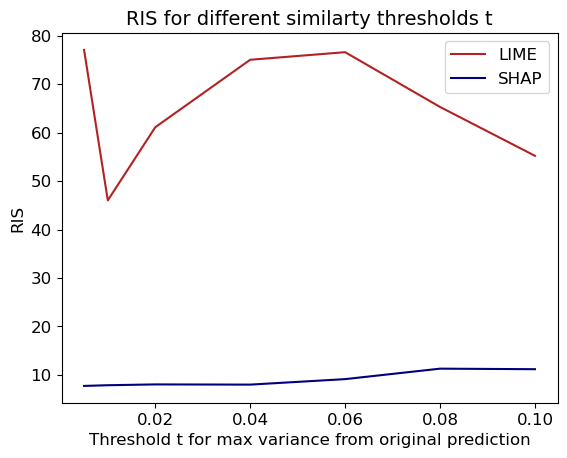

In [23]:
from matplotlib import pyplot as plt

plt.plot([i/100 for i in [0.5, 1, 2, 4, 6, 8, 10]], lime_RIS2, label = "LIME", color = "firebrick")

plt.plot([i/100 for i in [0.5, 1, 2, 4, 6, 8, 10]], shap_RIS2, label = "SHAP", color = "navy")
plt.title("RIS for different similarty thresholds t", fontsize = 14)
plt.xlabel("Threshold t for max variance from original prediction", fontsize = 12)
plt.ylabel("RIS", fontsize=12)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.legend(fontsize = 12)

## RIS for diff t

In [8]:
# RIS calculate percentage by norm division
import shap

lime_RIS3 = []
shap_RIS3 = []


for t in [i/100 for i in [0.5, 1, 2, 4, 6, 8, 10]]:
    X_sim, X_sim_p = similar_perturbations(X_test, features, model, perturbation = 0.05, sim_th=t, seed=0)

    lime_exp = LIME_global(X_train, X_sim, features, model)
    lime_exp_p = LIME_global(X_train, X_sim_p, features, model)
    _, R = RIS_norm(X_sim, X_sim_p, lime_exp, lime_exp_p, 2, epsilon_min = 0.1)
    lime_RIS3.append(R)


    X_train4shapely = pd.DataFrame(data=X_train, columns=features)
    explainer = shap.TreeExplainer(model, X_train4shapely)
    
    shap_values_1 = explainer.shap_values(X_sim)
    shap_values_2 = explainer.shap_values(X_sim_p)
    _, R = RIS_norm(X_sim, X_sim_p, shap_values_1, shap_values_2, 2, epsilon_min=0.1)
    shap_RIS3.append(R)

Intercept 0.4415617818813169
Prediction_local [2.2160757]
Right: 0.7722644
Intercept 0.4615012648211645
Prediction_local [0.46350949]
Right: 0.12173709
Intercept 0.4409849419012628
Prediction_local [2.11371478]
Right: 2.8154812
Intercept 0.415569454275725
Prediction_local [0.35021169]
Right: 0.01746045
Intercept 0.4267785405327631
Prediction_local [0.85198768]
Right: 0.11755557
Intercept 0.4075938023240852
Prediction_local [0.04349751]
Right: 0.059326336
Intercept 0.4321073061051539
Prediction_local [1.27513342]
Right: 0.32243693
Intercept 0.4696894764458507
Prediction_local [0.15212344]
Right: 0.07523854
Intercept 0.43832886436140817
Prediction_local [0.20496913]
Right: 0.026629847
Intercept 0.44964276949593074
Prediction_local [0.78501232]
Right: 0.21821369
Intercept 0.4484373125430263
Prediction_local [-0.65175154]
Right: 0.007501701
Intercept 0.4467098725933527
Prediction_local [-0.14157194]
Right: 0.04310848
Intercept 0.41326092270283127
Prediction_local [0.52736339]
Right: 0.0702

In [32]:
lime_RIS3

[0.08283757725658457,
 0.08200831328553528,
 0.08184487310990964,
 0.08198809481715985,
 0.08207392419055452,
 0.08240487391828545,
 0.08257844745034956]

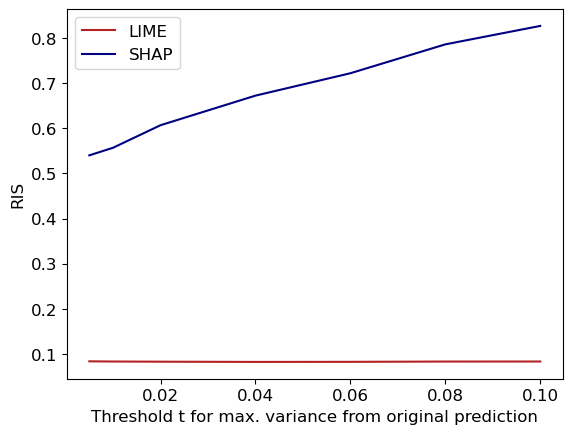

In [9]:
from matplotlib import pyplot as plt

plt.plot([i/100 for i in [0.5, 1, 2, 4, 6, 8, 10]], lime_RIS3, label = "LIME", color = "firebrick")

plt.plot([i/100 for i in [0.5, 1, 2, 4, 6, 8, 10]], shap_RIS3, label = "SHAP", color = "navy")
#plt.title("RIS for different similarity thresholds t", fontsize = 14)
plt.xlabel("Threshold t for max. variance from original prediction", fontsize = 12)
plt.ylabel("RIS", fontsize=12)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.legend(fontsize = 12)


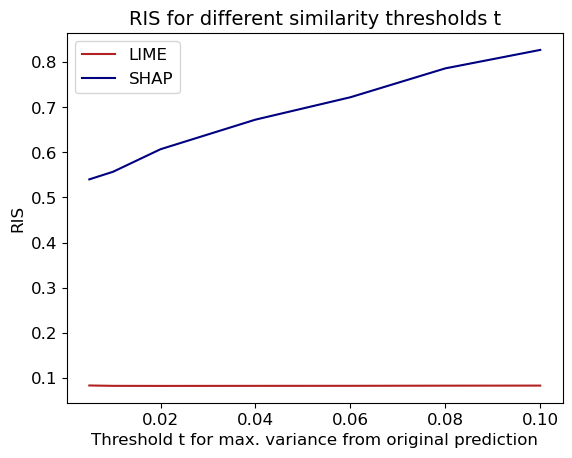

In [24]:
from matplotlib import pyplot as plt

plt.plot([i/100 for i in [0.5, 1, 2, 4, 6, 8, 10]], lime_RIS3, label = "LIME", color = "firebrick")

plt.plot([i/100 for i in [0.5, 1, 2, 4, 6, 8, 10]], shap_RIS3, label = "SHAP", color = "navy")
#plt.title("RIS for different similarity thresholds t", fontsize = 14)
plt.xlabel("Threshold t for max. variance from original prediction", fontsize = 12)
plt.ylabel("RIS", fontsize=12)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.legend(fontsize = 12)


# Stability 

In [48]:
max_ratio = 0
p = 2  
ratiolist = []

def stability(X_sim, X_prime, exp, exp_prime, p):
    X_sim = np.array(X_sim)
    X_prime = np.array(X_prime)
    exp = np.array(exp)
    exp_prime = np.array(exp_prime)
    
    ratiolist = []
    
    if len(X_sim) != len(X_prime) or len(exp) != len(exp_prime) or len(X_sim) != len(exp):
        raise ValueError("The length of the input data and the explanation data should be the same.")
    
    for i in range(len(X_prime)):
        
        diff_ex = np.linalg.norm(exp[i] - exp_prime[i], p)

        diff_input = np.linalg.norm(X_sim[i] - X_prime[i]) 

        ratio = diff_ex / diff_input
        ratiolist.append(ratio)

    return ratiolist, np.mean(ratiolist)

In [49]:
print("Simple Model - LIME:", stability(X_sim1, X_sim_p1, lime_exp, lime_exp_p, p)[1])
print("2-Stage Model - LIME:", stability(X_sim2, X_sim_p2, lime_exp2, lime_exp_p2, p)[1])
print("Simple Model - SHAP:", stability(X_sim1, X_sim_p1, shap_exp, shap_exp_p, p)[1])
print("2-Stage Model - SHAP:", stability(X_sim2, X_sim_p2, shap_exp2, shap_exp_p2, p)[1])

Simple Model - LIME: 0.025822169869165072
2-Stage Model - LIME: 0.02836813892094874
Simple Model - SHAP: 0.25165374413275277
2-Stage Model - SHAP: 0.8898015664635881


In [ ]:
lime_RIS4 = []
shap_RIS4 = []


for t in [i/100 for i in [0.5, 1, 2, 4, 6, 8, 10]]:
    X_sim, X_sim_p = similar_perturbations(X_test, features, model, perturbation = 0.05, sim_th=t, seed=0)

    lime_exp = LIME_global(X_train, X_sim, features, model)
    lime_exp_p = LIME_global(X_train, X_sim_p, features, model)
    _, R = stability(X_sim, X_sim_p, lime_exp, lime_exp_p, 2)
    lime_RIS4.append(R)


    X_train4shapely = pd.DataFrame(data=X_train, columns=features)
    explainer = shap.Explainer(model, X_train4shapely)
    
    shap_values_1 = explainer.shap_values(X_sim)
    shap_values_2 = explainer.shap_values(X_sim_p)
    _, R = stability(X_sim, X_sim_p, shap_values_1, shap_values_2, 2)
    shap_RIS4.append(R)

Intercept 0.4375508599605484
Prediction_local [2.30060582]
Right: 0.7722644
Intercept 0.4163652920074913
Prediction_local [0.41472584]
Right: 0.12173709
Intercept 0.41763605906627355
Prediction_local [1.9729033]
Right: 2.8154812
Intercept 0.40543653042558525
Prediction_local [0.47432954]
Right: 0.01746045
Intercept 0.4422917220422451
Prediction_local [0.74896969]
Right: 0.11755557
Intercept 0.4656857518252925
Prediction_local [0.03247893]
Right: 0.059326336
Intercept 0.43893734193432776
Prediction_local [1.02623176]
Right: 0.32243693
Intercept 0.4449335934887329
Prediction_local [0.19953009]
Right: 0.07523854
Intercept 0.45556597542930716
Prediction_local [0.22556459]
Right: 0.026629847
Intercept 0.4512680072039765
Prediction_local [0.80306472]
Right: 0.21821369
Intercept 0.40665570975069976
Prediction_local [-0.5986704]
Right: 0.007501701
Intercept 0.48974926589521006
Prediction_local [-0.18036407]
Right: 0.04310848
Intercept 0.4428523613947286
Prediction_local [0.4736882]
Right: 0.07

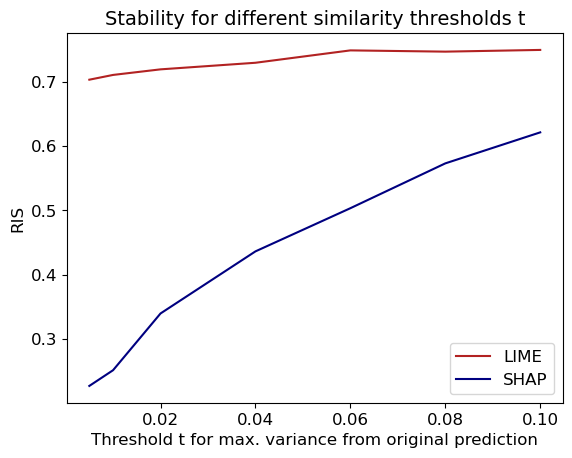

In [ ]:
from matplotlib import pyplot as plt

plt.plot([i/100 for i in [0.5, 1, 2, 4, 6, 8, 10]], lime_RIS4, label = "LIME", color = "firebrick")

plt.plot([i/100 for i in [0.5, 1, 2, 4, 6, 8, 10]], shap_RIS4, label = "SHAP", color = "navy")
plt.title("Stability for different similarity thresholds t", fontsize = 14)
plt.xlabel("Threshold t for max. variance from original prediction", fontsize = 12)
plt.ylabel("RIS", fontsize=12)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.legend(fontsize = 12)